# Проектная работа
  # Рынок заведений общественного питания Москвы

# Описание данных
 Файл `moscow_places.csv`:
    
`name` — название заведения;

`address` — адрес заведения;

`category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;

`hours` — информация о днях и часах работы;

`lat` — широта географической точки, в которой находится заведение;

`lng` — долгота географической точки, в которой находится заведение;

`rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);

`price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;

`avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
* «Средний счёт: 1000–1500 ₽»;
* «Цена чашки капучино: 130–220 ₽»;
* «Цена бокала пива: 400–600 ₽».
    
    и так далее;

`middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:

* Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
* Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
* Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

`middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:

* Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
* Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
* Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

`chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):

* 0 — заведение не является сетевым
* 1 — заведение является сетевым

`district` — административный район, в котором находится заведение, например Центральный административный округ;

`seats` — количество посадочных мест.

### Импортируем Библиотеки

In [38]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
!pip install folium
import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from folium.features import CustomIcon
import warnings
warnings.filterwarnings("ignore")

Читаем файл

In [39]:
data = pd.read_csv('moscow_places.csv')  

Посмотрим информацию

In [40]:
data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


In [41]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [42]:
data['name'].nunique()#уникальные заведения

5614

#### Что было сделано:

* импортировали библиотеки;

* записали данные в датафрейм;

* изучили общую информацию о полученном датафрейме;

* перевели столбец с названиями, адресом и средней стоимостью заказа в нижний регистр;

* посчитали количество уникальных названий заведений: в датасете у нас **5512** уникальных заведений.
#### В итоге        

* Столбцы `name`, `category`, `address`, `district`, `hours`, `price` и `avg_bill` имеют подходящий тип данных **object**, так как они описывают информацию о заведении;
* Столбцы `lat`, `lng`, `rating`, `middle_avg_bill`, `middle_coffee_cup` имеют подходящий тип данных **float**, так как значения в этих столбцах выражаются рациональными числами;
* Столбец `chain` имеет подходящий тип данных **int**, так как выражается целыми чилами;
* Столбцу `seats` больше подходит тип данных **int**, так как количество сидячих мест нем ожет быть дробным.

### Предобработка

#### Пропуски

In [43]:
data.isna().sum()#всего 8406 

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

#### Проанализируем: 
    
* Пропуски в `hours` и `seats` заполнить не получится(разве что в ручную найдя эти заведения и внеся данные в таблицу, что весьма трудоёмко)
    
* `price` в теории можно было бы заполнить средним значением, но в разных регионах разные цены, в связи с этим заполнить корректно не получится, к тому же это попортит столбец среднего чека(`middle_avg_bill`)
    
* `avg_bill`,`middle_avg_bill` и `middle_coffee_cup` сзаимозависимы - лучше не трогать
    
#### Решение - оставить всё как есть.    

#### Дублиткаты

In [44]:
data.duplicated().sum()#явные дубликаты

0

In [45]:
data.duplicated(subset = ['name', 'address']).sum()#неявные дубликаты, в данным случаем смотрим на совпадения в адресах и названиях

0

**Дубликаты не обнаружены**

#### Создаём необходимые столбцы

Создадим столбец `street` с названием улиц, данные для столбца возьмем из столбца с адресом(`address`)

In [46]:
data['street'] = data['address'].str.split(',').str[1] #поскольку адрес указан в формате 'Город, улица Такая-то, номер дома'/
                                                       #возьмем значение между запятыми

In [47]:
data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,Пролетарский проспект
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,Люблинская улица


Создадим столбец `is_24/7`, отображающий круглосуточные магазины. Информацию возьмём из столбца `hours`

In [48]:
#пришлось назвать его is_24_7, ниже, когда пытался нарисовать диаграмму python ругался на название is_24/7, что вполне справедливо

data['is_24_7'] = data['hours'] == 'ежедневно, круглосуточно'#в столбце hours, если магазин работает круглосуточно - 
                                                             #написано 'ежедневно, круглосуточно', а если не круглосуточно -
                                                             #указаны часы работы

In [49]:
data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица,False
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,Пролетарский проспект,False
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица,True
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,Люблинская улица,True


#### Что было сделано:

* Проверили датасет на дубликаты ;

* Посчитали пропуски.

* Пропуски в `hours`, `seats` правильно заполнить не удастся, так как это индивидуальные данные для каждого заведения.

* Столбец `price` в разных административных округах имеет разное значение, и заполять пропуски в соответствии со значениями в столбце `middle_avg_bill` будет некорректным.

* Значения в столбце `avg_bill` распределены по столбцам `middle_avg_bill` и `middle_coffee_cup`.

* Решение: оставить пропуски как есть

* Создали столбец `street` с названиями улиц из столбца с адресом.

* Создали столбец `is_24_7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

### Анализ данных

#### Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее.

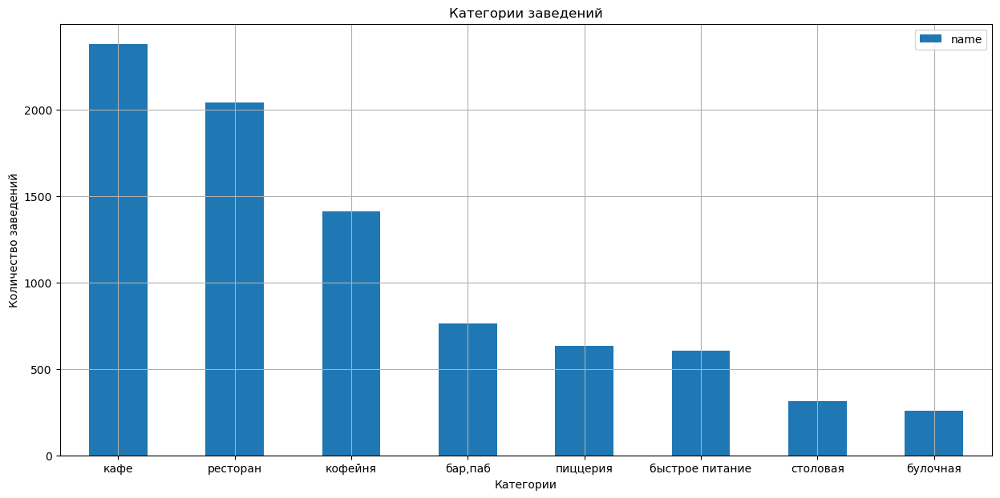

,name
category,
кафе,2378
ресторан,2043
кофейня,1413
"бар,паб",765
пиццерия,633
быстрое питание,603
столовая,315
булочная,256


In [50]:
colvo_cat = data.pivot_table(index = 'category', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False)
colvo_cat.plot(kind = 'bar', figsize = (15,7))
plt.title('Категории заведений')
plt.xlabel('Категории')
plt.ylabel('Количество заведений')
plt.xticks(rotation = 0)
plt.grid()
plt.show()
colvo_cat

Выше представлен топ категорий заведений с количеством. Больше всего в Москве кафе(удивительно, учитывая любовь москвичей к кофе на ходу, я думал кофеень будет больше), меньше всего булочных

#### Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее.

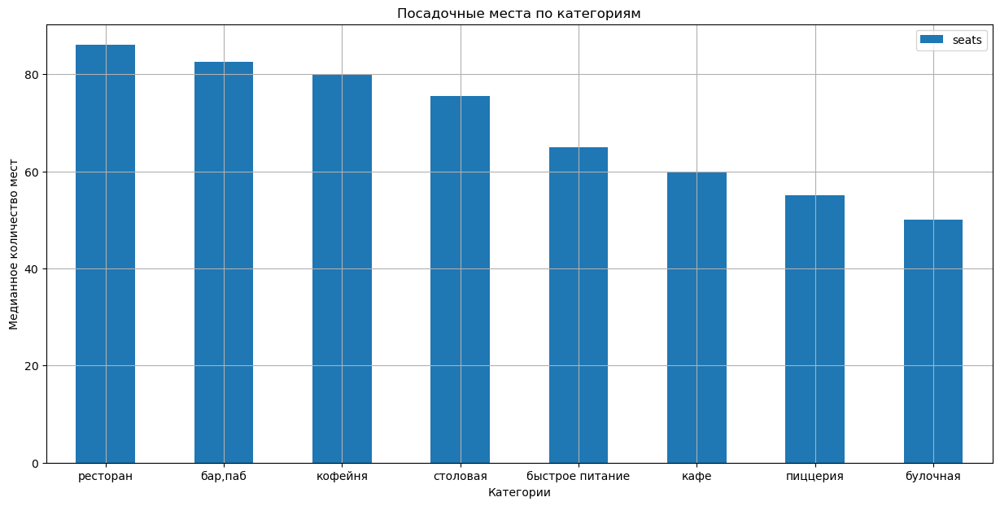

,seats
category,
ресторан,86.0
"бар,паб",82.5
кофейня,80.0
столовая,75.5
быстрое питание,65.0
кафе,60.0
пиццерия,55.0
булочная,50.0


In [51]:
colvo_mest = data.pivot_table(index = 'category', values = 'seats', aggfunc = 'median').sort_values(by = 'seats', ascending = False)
colvo_mest.plot(kind = 'bar', figsize = (15,7))
plt.title('Посадочные места по категориям')
plt.xlabel('Категории')
plt.ylabel('Медианное количество мест')
plt.xticks(rotation = 0)
plt.grid()
plt.show()
colvo_mest

Тут без сюпризов - больше всего посадочных мест в ресторанах, меньше всего в булочных

#### Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете. Посмотрим каких заведений больше.


Нарисовал диаграмму, понял, что лучше поменять 0 и 1 на 'сетевые' и 'несетевые' соответственно

In [52]:
data['chain'] = data['chain'].replace(0, 'несетевые')
data['chain'] = data['chain'].replace(1, 'сетевые')

In [53]:
seti = data.pivot_table(index = 'chain', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False).reset_index()
seti.columns = ['chain', 'count']
fig = go.Figure(data=[go.Pie(labels=seti['chain'], values=seti['count'])])
fig.update_layout(title='Соотношение "сетевых" и "несетевых" заведений')
fig.show()

Сетевых заведений меньше - 38,1%, несетевых больше - 61,9%

#### Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

In [54]:
chain_cat = data.query('chain == "сетевые"').pivot_table(index = 'category', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False)
chain_cat_merge = colvo_cat.merge(chain_cat, how = 'left', on = 'category').reset_index()
chain_cat_merge.columns = ['category','count','chain']
chain_cat_merge['percent'] = round(chain_cat_merge['chain']/chain_cat_merge['count']*100, 1)
chain_cat_merge

,category,count,chain,percent
0,кафе,2378,779,32.8
1,ресторан,2043,730,35.7
2,кофейня,1413,720,51.0
3,"бар,паб",765,169,22.1
4,пиццерия,633,330,52.1
5,быстрое питание,603,232,38.5
6,столовая,315,88,27.9
7,булочная,256,157,61.3


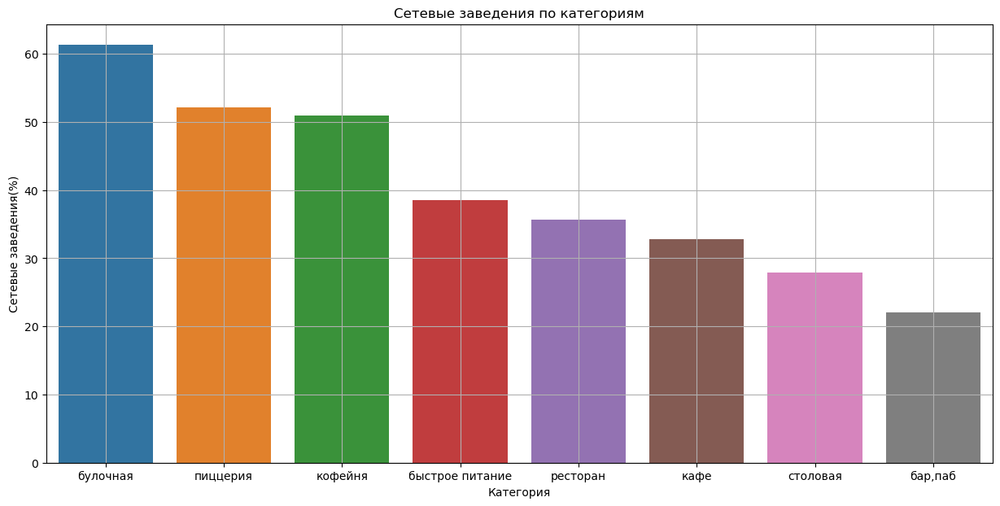

In [55]:
plt.figure(figsize=(15, 7))
sns.barplot(x='category', y='percent',data=chain_cat_merge.sort_values(by = 'percent', ascending = False))
plt.title('Сетевые заведения по категориям')
plt.xlabel('Категория')
plt.ylabel('Сетевые заведения(%)')
plt.xticks(rotation=0)
plt.grid()
plt.show()

Чаще всего сетевыми являются булочные, реже всего бары и пабы

#### Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве. 
Под популярностью понимается количество заведений этой сети в регионе.

In [56]:
top_chain = data.query('chain == "сетевые"').pivot_table(index = 'name', values = 'chain', aggfunc = 'count').sort_values(by = 'chain', ascending = False).reset_index().head(15)
fig = px.bar(top_chain, x='name', y='chain', title = 'ТОП-15 Сетевых заведений')
fig.update_layout(xaxis_title='Название', yaxis_title='Количество заведений')
fig.update_xaxes(tickangle=45)
fig.show()
top_chain

,name,chain
0,Шоколадница,120
1,Домино'с Пицца,76
2,Додо Пицца,74
3,One Price Coffee,71
4,Яндекс Лавка,69
5,Cofix,65
6,Prime,50
7,Хинкальная,44
8,КОФЕПОРТ,42
9,Кулинарная лавка братьев Караваевых,39


Самая большая сеть в Москве - **Шоколадница**, самая маленькая - **Му-Му**

Из вышуперечисленных заведений не знаю только **Prime**, **КОФЕПОРТ**, **CofeFest** и **Буханку**, остальные на слуху

In [57]:
top_chain_name = top_chain['name']
top_chain_cat = data.query('name in @top_chain_name').pivot_table(index = 'category', values = 'name', aggfunc = 'nunique').reset_index()
fig = px.bar(top_chain_cat, x='category', y='name')
fig.update_layout(title='Количество заведений из популярных сетей по категориям',xaxis_title='Категория',yaxis_title='Количество заведений',xaxis={'categoryorder':'total descending'})
fig.show()

Больше всего в данном топе **кафе**(**8**), на 2ом месте **кофейни**(**7**), меньше всего **пабов**(**2**) и **булочных**(**1**)

#### Посмотрим какие административные районы Москвы присутствуют в датасете. Отобразим общее количество заведений и количество заведений каждой категории по районам.

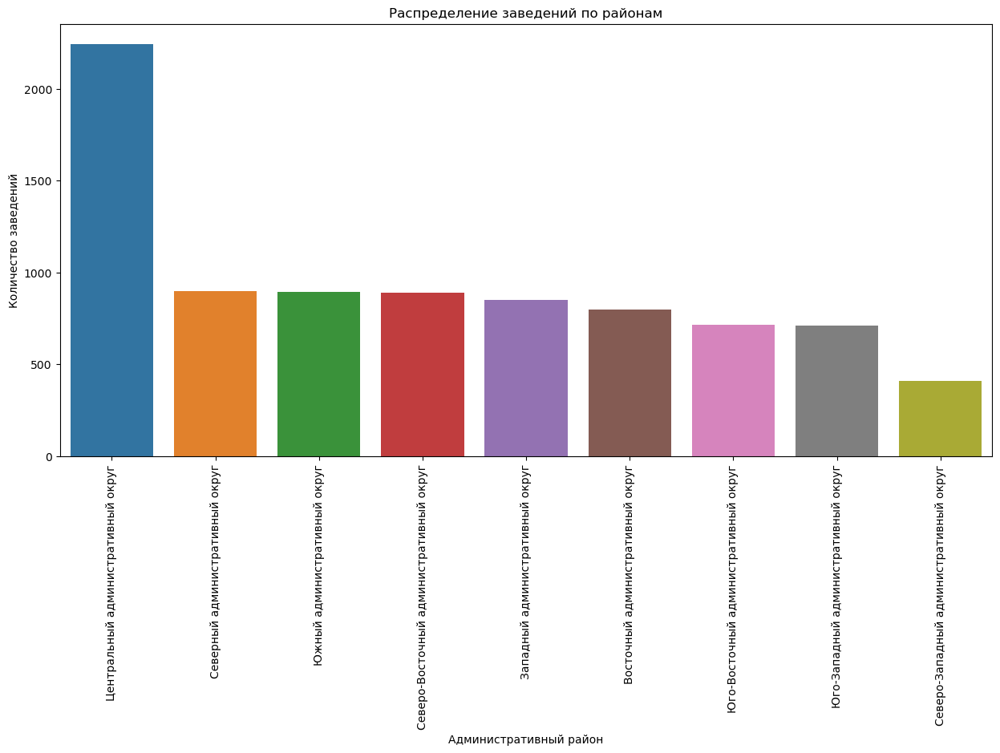

,district,name
0,Центральный административный округ,2242
1,Северный административный округ,900
2,Южный административный округ,892
3,Северо-Восточный административный округ,891
4,Западный административный округ,851
5,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
8,Северо-Западный административный округ,409


In [58]:
#Распределение без категорий
rayon = data.pivot_table(index = 'district', values = 'name', aggfunc = 'count').sort_values(by= 'name', ascending = False).reset_index()
plt.figure(figsize = (15,7))
sns.barplot(x = 'district', y = 'name', data = rayon)
plt.title('Распределение заведений по районам')
plt.xlabel('Административный район')
plt.ylabel('Количество заведений')
plt.xticks(rotation = 90)
plt.show()
rayon

In [59]:
#Распределение по категориям
rayon_cat = data.groupby(['district', 'category']).agg(count = ('category', 'count')).reset_index()
fig = px.bar(rayon_cat.sort_values(by = 'count', ascending = False), x = 'district', y = 'count', color ='category')
fig.update_layout(title = 'Распределение заведений по районам в каждой категории', xaxis_title = 'Район', yaxis_title = 'Количество заведений', height = 800, width = 1000, xaxis={'categoryorder':'total descending'})
fig.show()

Наибольшее количество заведений находится в Центральном административном округе, Меньше всего в Северо-Западном.В Центральном администативном округе большую часть заведений составляют рестораны, затем следуют кафе, кофейни и бары. В других округах большую часть заведений составляют кафе.

#### Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

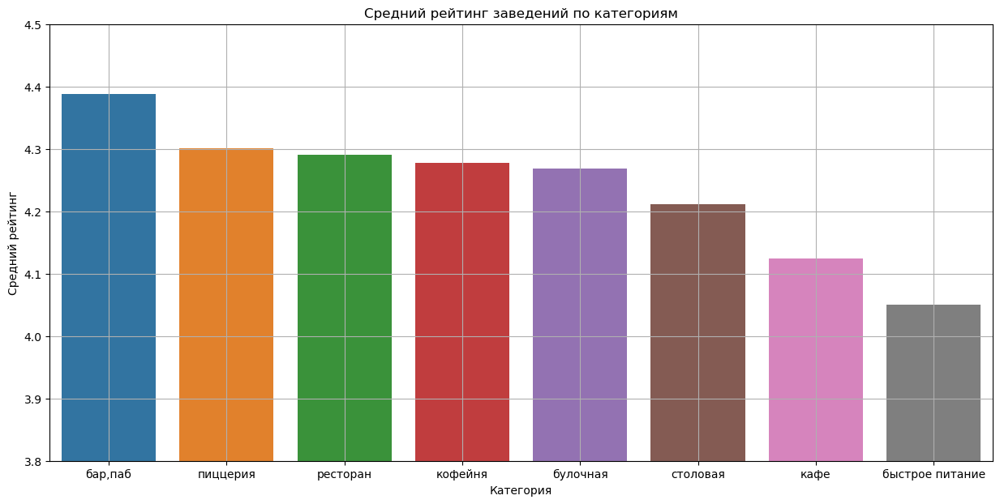

,category,mean_raiting
0,"бар,паб",4.387712
1,пиццерия,4.301264
2,ресторан,4.290357
3,кофейня,4.277282
4,булочная,4.268359
5,столовая,4.211429
6,кафе,4.123886
7,быстрое питание,4.050249


In [60]:
raiting = data.groupby('category').agg(mean_raiting=('rating', 'mean')).sort_values(by='mean_raiting', ascending=False).reset_index()

plt.figure(figsize=(15,7))
sns.barplot(x = 'category', y = 'mean_raiting', data = raiting)
plt.title('Средний рейтинг заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Средний рейтинг')
plt.xticks(rotation=0)
plt.ylim(3.8, 4.5)
plt.grid()
plt.show()
raiting

Самый высокий средний рейтинг - **4,38** у **'бар, паб'**, самый низкий у **быстрого питания** - **4,05**

#### Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. 


In [61]:
rayon_rait = data.groupby('district').agg(mean_raiting=('rating', 'mean')).sort_values(by='mean_raiting', ascending=False).reset_index()
rayon_geo = 'admin_level_geomap.geojson'

moscow_lat, moscow_lng = 55.751244, 37.618423

carta_M = Map(location = [moscow_lat, moscow_lng], zoom_start = 10) 

Choropleth(geo_data = rayon_geo, data = rayon_rait, columns = ['district', 'mean_raiting'], key_on = 'feature.name',fill_color = 'YlGn',fill_opacity = 0.5, legend_name = 'Медианный рейтинг по районам').add_to(carta_M)
carta_M

#### Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки `folium`.

In [62]:
mapp = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(mapp)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)


data.apply(create_clusters, axis=1)


mapp

#### Найдем топ-15 улиц по количеству заведений.

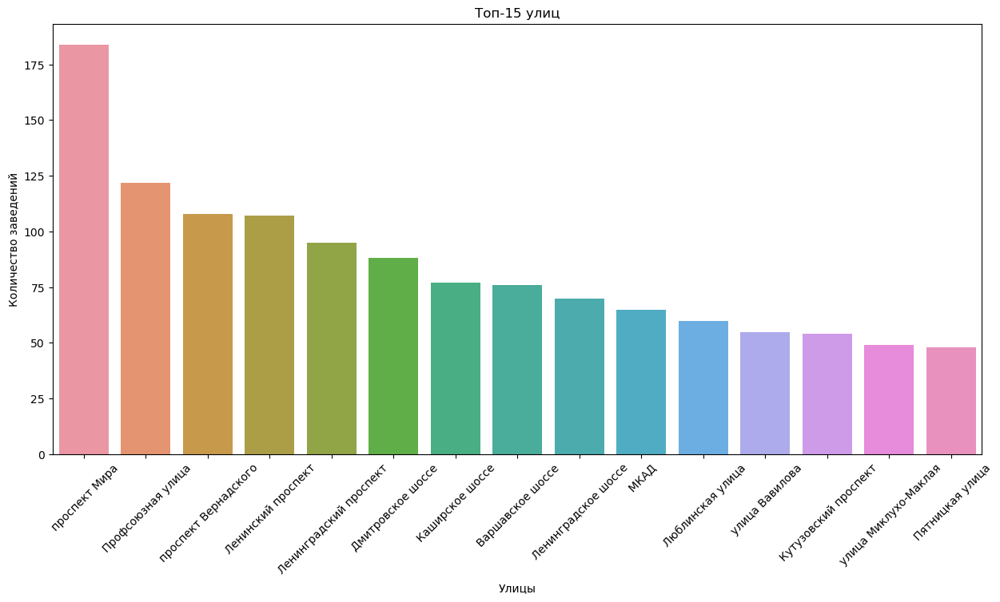

,street,name
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


In [63]:
top_str = data.pivot_table(index = 'street', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False).reset_index().head(15)
plt.figure(figsize = (15,7))
sns.barplot(x = 'street', y = 'name', data = top_str)
plt.title('Топ-15 улиц')
plt.xlabel('Улицы')
plt.ylabel('Количество заведений')
plt.xticks(rotation = 45)
plt.show()
top_str

#### Посмотрим на распределение заведений по районам

In [64]:
street = top_str['street']
str_per_cat = data.query('street in @street').groupby(['street', 'category']).agg(count = ('category', 'count')).reset_index()
fig = px.bar(str_per_cat.sort_values(by = 'count', ascending = False), x = 'street', y = 'count', color = 'category')
fig.update_layout(title = 'Заведения в каждой категории по районам', xaxis_title = 'Район', yaxis_title = 'Количество заведений', height = 800, width = 1000, xaxis = {'categoryorder':'total descending'})
fig.show()

Больше всего заведений на **Проспекте Мира**. Больше всего **Кафе**, меньше всего **столовых**

#### Найдем улицы, на которых находится только один объект общепита.

In [65]:
street_uniq = data.pivot_table(index = 'street', values = 'name', aggfunc = 'count').query('name == 1').reset_index()
unique_str = street_uniq['street']
data_unique_str = data.query('street in @unique_str')
data_unique_str

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
15,Дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,несетевые,180.0,улица Бусиновская Горка,False
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,несетевые,NaN,Прибрежный проезд,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,сетевые,NaN,парк Левобережный,False
58,Coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,сетевые,NaN,Угличская улица,False
60,Чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,сетевые,NaN,ландшафтный заказник Лианозовский,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8289,Мираж,ресторан,"Москва, улица Шкулёва, 2А",Юго-Восточный административный округ,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",55.693340,37.746231,4.7,NaN,NaN,NaN,NaN,несетевые,90.0,улица Шкулёва,False
8294,WTFcoffee,кофейня,"Москва, улица Артюхиной, 14/8с1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,NaN,NaN,NaN,несетевые,NaN,улица Артюхиной,False
8317,Беседка,кафе,"Москва, Кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,сетевые,NaN,Кузьминская улица,False
8379,Лагман Хаус,кафе,"Москва, Новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,сетевые,40.0,Новороссийская улица,False


458 заведений, посмотрим распределение по категориям

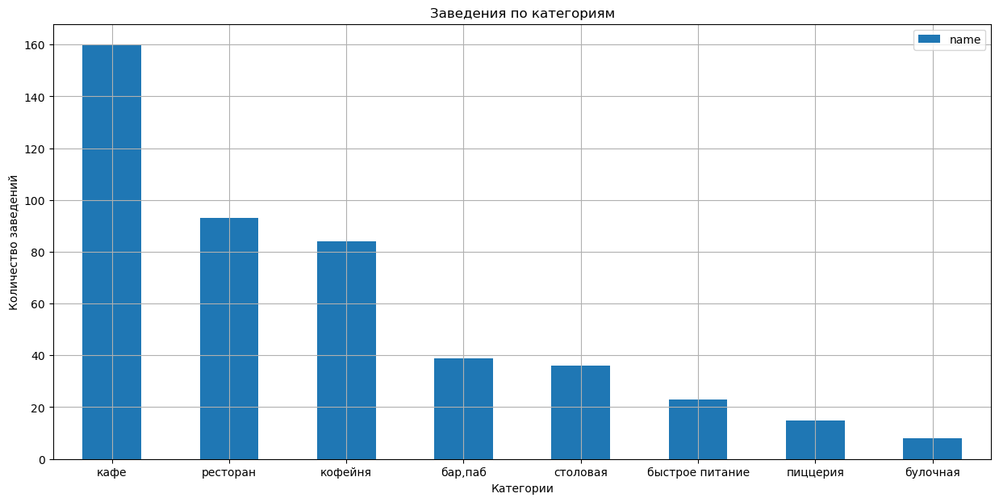

In [66]:
data_unique_str.pivot_table(index = 'category', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False).plot(kind = 'bar', figsize=(15, 7))
plt.title('Заведения по категориям')
plt.ylabel('Количество заведений')
plt.xlabel('Категории')
plt.xticks(rotation = 0)
plt.grid()
plt.show()

Больше всего кафе, меньше всего булочных.

Посмотрим распределение по районам

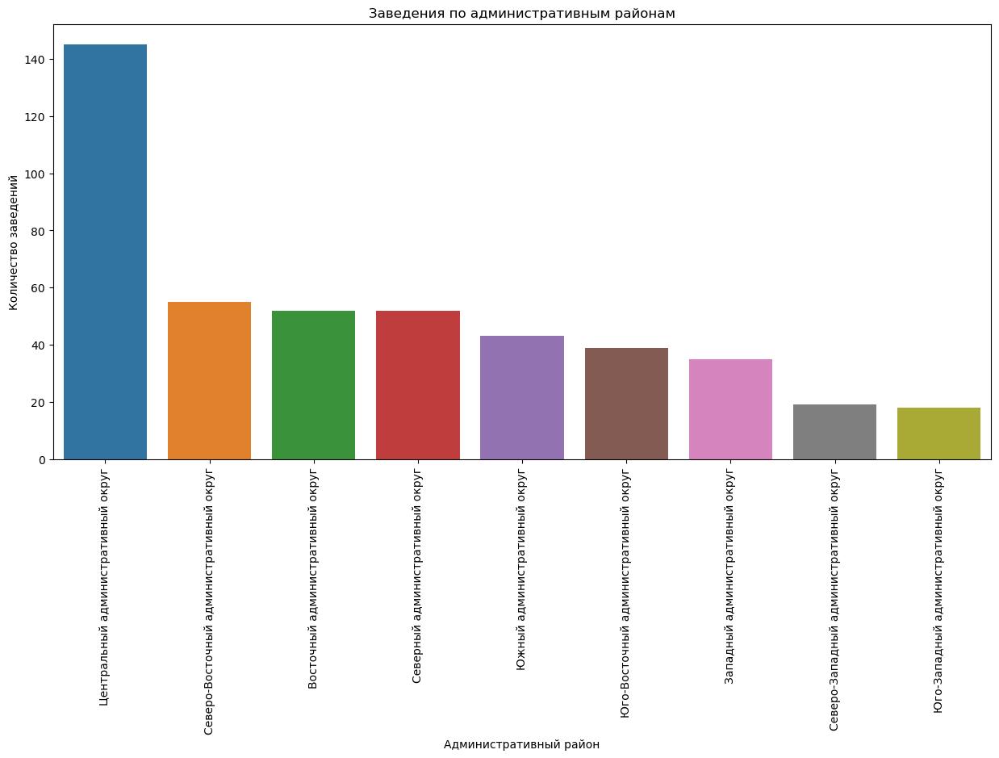

,district,name
0,Центральный административный округ,145
1,Северо-Восточный административный округ,55
2,Восточный административный округ,52
3,Северный административный округ,52
4,Южный административный округ,43
5,Юго-Восточный административный округ,39
6,Западный административный округ,35
7,Северо-Западный административный округ,19
8,Юго-Западный административный округ,18


In [67]:
rayon_uniq = data_unique_str.pivot_table(index = 'district', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False).reset_index()
plt.figure(figsize = (15,7))
sns.barplot(x = 'district', y = 'name', data = rayon_uniq)
plt.title('Заведения по административным районам')
plt.xlabel('Административный район')
plt.ylabel('Количество заведений')
plt.xticks(rotation = 90)
plt.show()
rayon_uniq

ЦАО снова лидирует, в ЮЗАО меньше всего заведений

Посмотрим сетевые и несетевые заведения

In [68]:
chain_unique = data.pivot_table(index = 'chain', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False).reset_index()
chain_unique.columns = ['chain', 'count']
fig = go.Figure(data=[go.Pie(labels=chain_unique['chain'], values=chain_unique['count'])])
fig.update_layout(title = 'Сетевые и несетевые заведения')
fig.show()

Сетевых - 38.1%, несетевых - 61.9%

In [69]:
rayon_bill = data.groupby('district').agg(rayon_bill=('middle_avg_bill', 'median')).sort_values(by='rayon_bill', ascending=False).reset_index()
mapp1 = Map(location = [moscow_lat, moscow_lng], zoom_start = 10)
Choropleth(geo_data = rayon_geo, data = rayon_bill, columns = ['district', 'rayon_bill'], key_on = 'feature.name', fill_color = 'YlGn', fill_opacity = 0.8, legend_name = 'Медианный средний чек заведений по районам').add_to(mapp1)
mapp1


In [70]:
rayon_bill

,district,rayon_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


Топ самых высоких средних чеков возглавляют ЗАО и ЦАО(1000), внизу топа ЮАО(500) и ЮВАО(450).

#### Обобщим
* Больше всего в Москве **кафе**, меньше всего **булочных**
* Больше всего посадочных мест в **ресторанах**, меньше всего в **булочных**
* **Сетевых** заведений меньше - **38,1%**, **несетевых** больше - **61,9%**
* Чаще всего сетевыми являются **булочные**, реже всего **бары** и **пабы**
* Самая большая сеть в Москве - **Шоколадница**, самая маленькая - **Му-Му** 
* Наибольшее количество заведений находится в **Центральном административном округе**, Меньше всего в **Северо-Западном**.
* В **Центральном администативном округе** большую часть заведений составляют **рестораны**, затем следуют **кафе**, **кофейни** и **бары**. В других округах большую часть заведений составляют **кафе**.
* Самый высокий средний рейтинг - **4,38** у **'бар, паб'**, самый низкий у **быстрого питания** - **4,05**
* Больше всего заведений на **Проспекте Мира**. Больше всего **Кафе**, меньше всего **столовых**
* Улиц, на которых один объект общепита **457**. По категориям большую часть занимают кафе. Больше всего таких заведений в **Центральном административном округе**. Сетевых - **38.1%**, несетевых - **61.9%**
* Топ самых высоких средних чеков возглавляют **ЗАО** и **ЦАО**(1000), внизу топа **ЮАО**(500) и **ЮВАО**(450).

### Шаг 4. Детализируем исследование: открытие кофейни

#### Посмотрим сколько всего кофеен в датасете, в каких районах их больше всего, каковы особенности их расположения

In [71]:
data_coffee = data.query('category == "кофейня"')
data_coffee

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,несетевые,NaN,улица Маршала Федоренко,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,сетевые,NaN,парк Левобережный,False
45,9 Bar Coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,сетевые,46.0,Коровинское шоссе,False
46,CofeFest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,сетевые,NaN,улица Маршала Федоренко,False
52,Cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,сетевые,NaN,улица Дыбенко,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8356,Назис Пури,кофейня,"Москва, Люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,NaN,NaN,NaN,NaN,несетевые,NaN,Люблинская улица,False
8365,Квадрат кофе,кофейня,"Москва, Волгоградский проспект, 73, стр. 1",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.709710,37.744450,4.2,NaN,Цена чашки капучино:100–220 ₽,NaN,160.0,несетевые,206.0,Волгоградский проспект,False
8376,Шоколад имбирь корица,кофейня,"Москва, Грайвороновская улица, 23",Юго-Восточный административный округ,пн-пт 09:30–19:30,55.721213,37.740755,4.1,NaN,NaN,NaN,NaN,несетевые,NaN,Грайвороновская улица,False
8385,Cafio,кофейня,"Москва, Новохохловская улица, 49",Юго-Восточный административный округ,"пн-пт 07:00–22:00; сб,вс 07:00–21:00",55.724357,37.716415,4.7,NaN,Цена чашки капучино:80–120 ₽,NaN,100.0,несетевые,NaN,Новохохловская улица,False


1413 кофеен

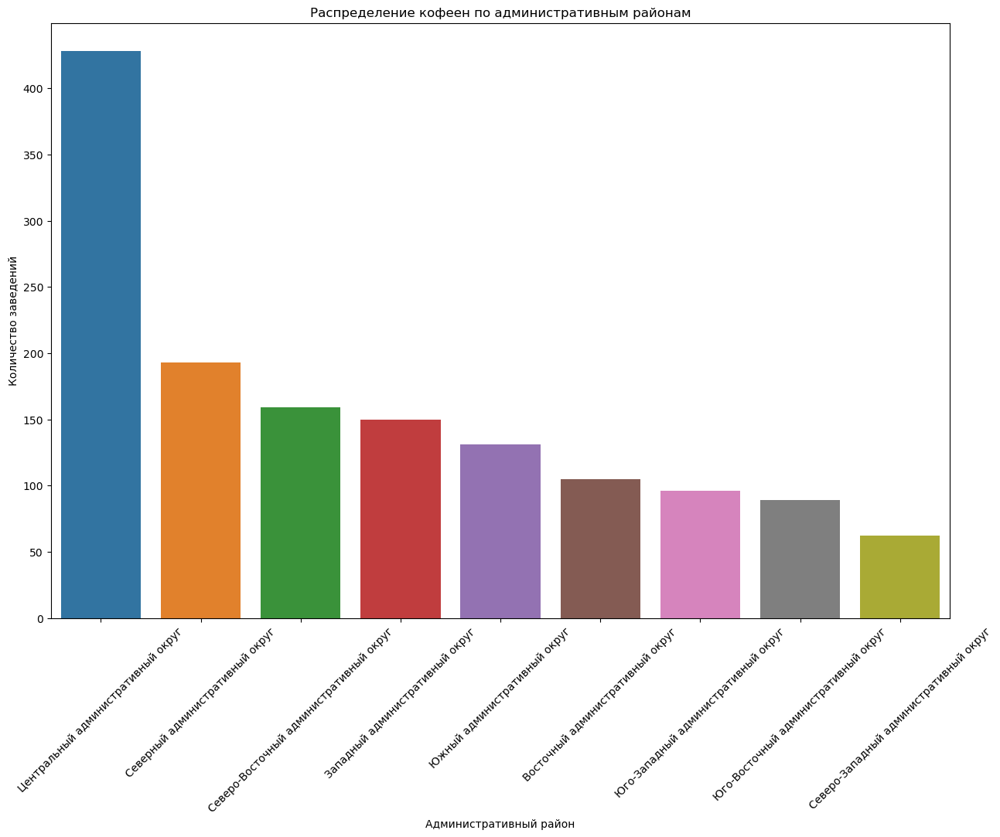

,district,name
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


In [72]:
rayon = data_coffee.pivot_table(index = 'district', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False).reset_index()
plt.figure(figsize = (15,10))
sns.barplot(x = 'district', y = 'name', data = rayon)
plt.title('Распределение кофеен по административным районам')
plt.xlabel('Административный район')
plt.ylabel('Количество заведений')
plt.xticks(rotation = 45)
plt.show()
rayon

In [73]:
mapp2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(geo_data = rayon_geo,data = rayon,columns = ['district', 'name'],key_on = 'feature.name',fill_color = 'YlGn',fill_opacity = 0.8,legend_name = 'Количество кофеен по районам').add_to(mapp2)
mapp2

Больше всего кофеен в ЦАО - 428, меньше всего в СЗАО - 62

#### Посмортим есть ли круглосуточные кофейни

In [74]:
data_coffee['is_24_7'] = data_coffee['is_24_7'].replace(True, 'круглосуточные 24/7')
data_coffee['is_24_7'] = data_coffee['is_24_7'].replace(False, 'некруглосуточные')
is_24_7 = data_coffee.pivot_table(index = 'is_24_7', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False).reset_index()
is_24_7.columns = ['is_24_7', 'count']
fig = go.Figure(data = [go.Pie(labels = is_24_7['is_24_7'], values = is_24_7['count'])])
fig.update_layout(title = 'Соотношение круглосуточных и некруглосуточных заведений')
fig.show()

Только **4.18%** кофеен круглосуточные, видимо по ночам клиенты предпочитают, что-то покрепче :)

#### Посмотрим какие у кофеен рейтинги и как они распределяются по районам

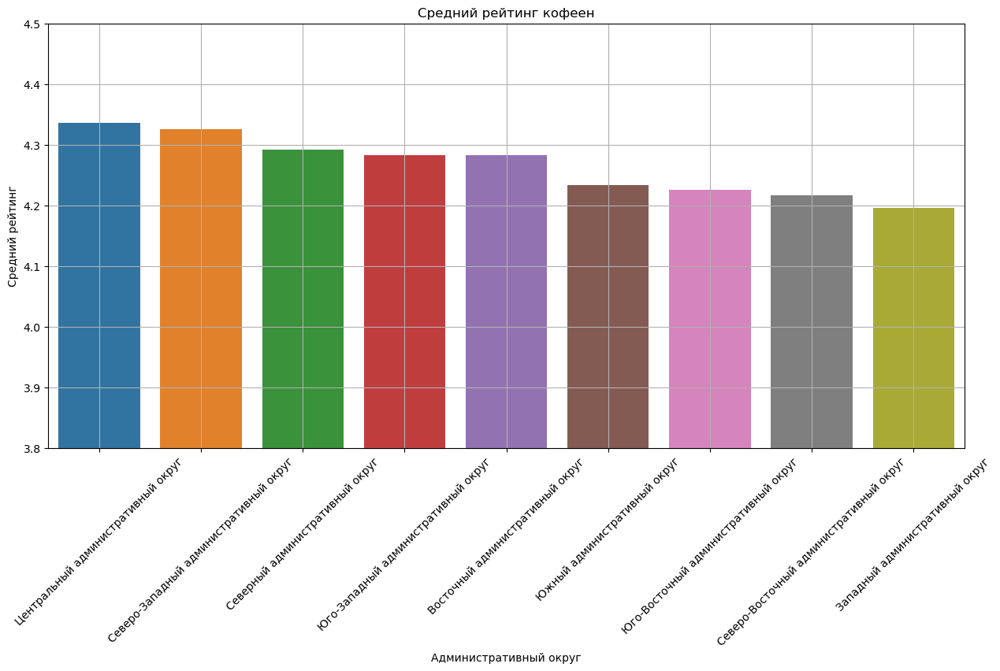

,district,mean_raiting
0,Центральный административный округ,4.336449
1,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
3,Юго-Западный административный округ,4.283333
4,Восточный административный округ,4.282857
5,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
7,Северо-Восточный административный округ,4.216981
8,Западный административный округ,4.195333


In [75]:
coffee_rayon_rait = data_coffee.groupby('district').agg(mean_raiting = ('rating', 'mean')).sort_values(by = 'mean_raiting', ascending = False).reset_index()
plt.figure(figsize = (15,7))
sns.barplot(x = 'district', y ='mean_raiting', data = coffee_rayon_rait)
plt.title('Средний рейтинг кофеен')
plt.xlabel('Административный округ')
plt.ylabel('Средний рейтинг')
plt.xticks(rotation=45)
plt.ylim(3.8, 4.5)
plt.grid()
plt.show()
coffee_rayon_rait

Самый высокий средний рейтинг в **Центральном административном округе**(4.3). Самый низкий средний рейтинг в **Западном административном округе**(ниже 4.2).

#### Посмотрим на какую стоимость чашки капучино стоит ориентироваться при открытии и почему

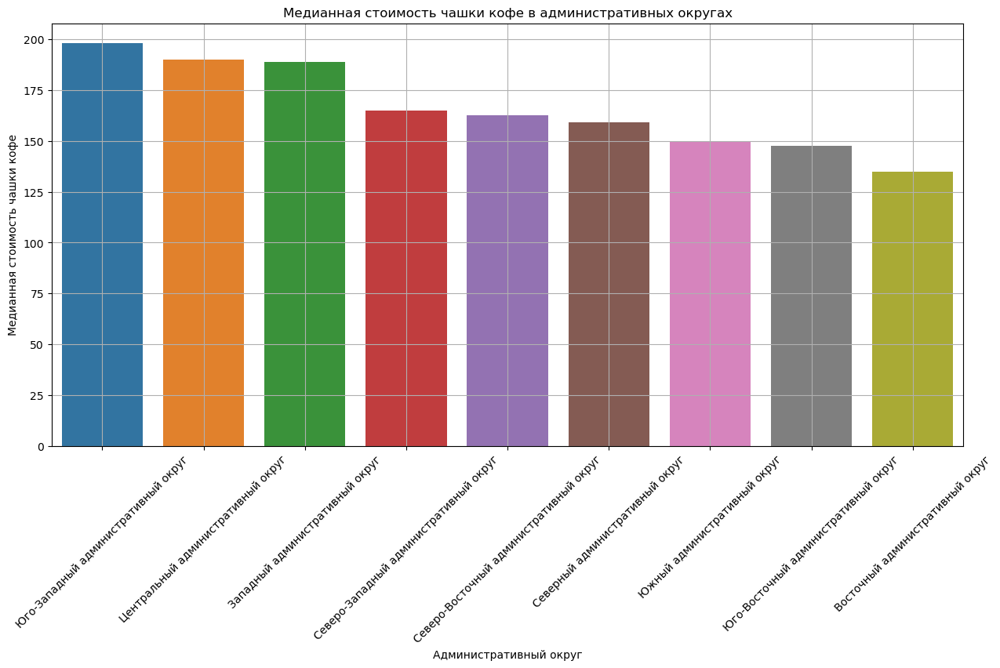

,district,middle_coffee_cup
0,Юго-Западный административный округ,198.0
1,Центральный административный округ,190.0
2,Западный административный округ,189.0
3,Северо-Западный административный округ,165.0
4,Северо-Восточный административный округ,162.5
5,Северный административный округ,159.0
6,Южный административный округ,150.0
7,Юго-Восточный административный округ,147.5
8,Восточный административный округ,135.0


In [76]:
middle_coffee_cup = data_coffee.pivot_table(index = 'district', values = 'middle_coffee_cup', aggfunc = 'median').sort_values(by = 'middle_coffee_cup', ascending = False).reset_index()
plt.figure(figsize = (15,7))
sns.barplot(x = 'district', y = 'middle_coffee_cup', data = middle_coffee_cup)
plt.title('Медианная стоимость чашки кофе в административных округах')
plt.xlabel('Административный округ')
plt.ylabel('Медианная стоимость чашки кофе')
plt.xticks(rotation=45)
plt.grid()
plt.show()
middle_coffee_cup

Самая высокая стоимость средней чашки кофе в Юго-Западном АО - **198 руб**. Самая низкая стоимость в Восточном АО - **135 руб**.

### Рекомендации

Учитывая проанализированную информацию стоит открыть кофейню в Юго-Западном автономном округе, так как нам самая низкая плотность кофеен, а также самые дорогие цены на чашку кофе, а значит, конкуренция будет небольшая и можно сыграть на низкой стоимости чашки кофе, например провести рекламную компанию на подобие "Дешевле чем во всём районе". Также рекомендуется открывать кофейню в местах с большой проходимостью - около метро, бизнес центров и учебных заведений. В ЮЗАО могу порекомендовать метро Юго-Западная, так как там находятся РАНХиГС, МИРЕА, а также высшая школа финансов и менеджмента. Также стоит обратить внимание на метро Университет, так как там находится университет МГУ.

### Общий вывод
        
#### Во-первых:

* импортировали библиотеки;

* записали данные в датафрейм;

* изучили общую информацию о полученном датафрейме;

* перевели столбец с названиями, адресом и средней стоимостью заказа в нижний регистр;

* посчитали количество уникальных названий заведений: в датасете у нас 5512 уникальных заведений.

* Столбцы `name`, `category`, `address`, `district`, `hours`, `price` и `avg_bill` имеют подходящий тип данных **object**, так как они описывают информацию о заведении;
* Столбцы `lat`, `lng, rating`, `middle_avg_bill`, `middle_coffee_cup` имеют подходящий тип данных **float**, так как значения в этих столбцах выражаются рациональными числами;
* Столбец `chain` имеет подходящий тип данных **int**, так как выражается целыми чилами;
* Столбцу `seats` больше подходит тип данных **int**, так как количество сидячих мест нем ожет быть дробным.

#### Во-вторых:

* Проверили датасет на дубликаты и удалили их;
    
* Посчитали пропуски.

* Пропуски в `hours`, `seats` правильно заполнить не удастся, так как это индивидуальные данные для каждого заведения.

* Столбец `price` в разных административных округах имеет разное значение, и заполять пропуски в соответствии со значениями в столбце `middle_avg_bill` будет некорректным.

* Значения в столбце `avg_bill` распределены по столбцам `middle_avg_bill` и `middle_coffee_cup`.

* Решение: оставить пропуски как есть

* Создали столбец `street` с названиями улиц из столбца с адресом.
    
* Создали столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7).

#### В анализе данных:

* Исследовали количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построили визуализации.
    
* Исследовали количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построили визуализации.

* Рассмотрели и изобразили соотношение сетевых и несетевых заведений в датасете.

* Рассмотрели и изобразили соотношение сетевых и несетевых заведений по категориям.

* Сгруппировали данные по названиям заведений и нашли топ-15 популярных сетей в Москве.

* Отобразили общее количество заведений и количество заведений каждой категории по районам.

* Визуализировали распределение средних рейтингов по категориям заведений.

* Построили фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

* Отобразили все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

* Нашли топ-15 улиц по количеству заведений. Построили график распределения количества заведений и их категорий по этим улицам.

* Нашли улицы, на которых находится только один объект общепита.

* Посчитали медиану `middle_avg_bill` столбца для каждого района. Построили фоновую картограмму (хороплет) с полученными значениями для каждого района. 

* Проанализировали цены в центральном административном округе и других.

####  Итог анализа
* Больше всего в Москве **кафе**, меньше всего **булочных**

* Больше всего посадочных мест в **ресторанах**, меньше всего в **булочных**

* Сетевых заведений меньше - **38,1%**, несетевых больше - **61,9%**

* Чаще всего сетевыми являются **булочные**, реже всего **бары и пабы**

* Самая большая сеть в Москве - **Шоколадница**, самая маленькая - **Му-Му **

* Наибольшее количество заведений находится в **Центральном административном округе**, Меньше всего в **Северо-Западном**.В **Центральном администативном округе** большую часть заведений составляют **рестораны**, затем следуют **кафе**, **кофейни** и **бары**. В других округах большую часть заведений составляют **кафе**.

* Самый высокий средний рейтинг - 4,38 у **'бар, паб'**, самый низкий у **быстрого питания** - 4,05

* Больше всего заведений на **Проспекте Мира**. Больше всего **Кафе**, меньше всего **столовых**

* Улиц, на которых один объект общепита **457**. По категориям большую часть занимают **кафе**. Больше всего таких заведений в **Центральном административном округе**. Сетевых **38.1%**, несетевых **61.9%**

* Топ самых высоких средних чеков возглавляют **ЗАО** и **ЦАО**(1000), внизу топа **ЮАО**(500) и **ЮВАО**(450).

#### При детализированном исследовании
* Узнали сколько всего кофеен в датасете, в каких районах их больше всего, каковы особенности их расположения.

* Узнали есть ли круглосуточные кофейни.

* Узнали какие у кофеен рейтинги и как они распределяются по районам

* Узнали на какую стоимость чашки капучино стоит ориентироваться при открытии и почему.

#### Итог детализации
* Больше всего кофеен в **ЦАО** - 428, меньше всего в **СЗАО** - 62

* Только **4.18%** кофеен круглосуточные

* Самый высокий средний рейтинг в **Центральном административном округе**(4.3). Самый низкий средний рейтинг в **Западном административном округе** (ниже 4.2)

* Самая высокая стоимость средней чашки кофе в Юго-Западном АО - **198 руб.** Самая низкая стоимость в Восточном АО - **135 руб.**

#### Итоговые рекомендации
     Учитывая проанализированную информацию стоит открыть кофейню в Юго-Западном автономном округе, так как нам самая низкая плотность кофеен, а также самые дорогие цены на чашку кофе, а значит, конкуренция будет небольшая и можно сыграть на низкой стоимости чашки кофе, например провести рекламную компанию на подобие "Дешевле чем во всём районе". Также рекомендуется открывать кофейню в местах с большой проходимостью - около метро, бизнес центров и учебных заведений. В ЮЗАО могу порекомендовать метро Юго-Западная, так как там находятся РАНХиГС, МИРЕА, а также высшая школа финансов и менеджмента. Также стоит обратить внимание на метро Университет, так как там находится университет МГУ.

Презентация: https://drive.google.com/file/d/1L9KyfTI3St8VwOax0x_2g1on0jWWXqQj/view?usp=drive_link